# Name           : Ramkumar Rajagopalan

## Assignment No : 1

#### Setup

#### Import the required packages

In [1]:
from utils.packages import *
from utils.data_prep import *
from utils.modelling import *
from config.variables import *

 Found and Using 1 GPU


#### Read data

In [2]:
data["df"] = pd.read_csv('data/data.csv')

### EDA

#### Highlevel description of data

In [3]:
data["df"].head()

,income_tagging,age,working_sector,working_hours_per_week,origin_country,education,marital_status,job,relationship,investment_gain,investment_loss
0,more than $50000,36,government,40,usa,bachelors,married,professional specialty,husband,0,0
1,more than $50000,41,government,38,usa,highschool,married,clerical,wife,0,0
2,less than or equals to $50000,22,private,40,usa,community college,married,craftsman,husband,0,0
3,less than or equals to $50000,34,private,42,usa,community college,never married,clerical,not in family,0,0
4,less than or equals to $50000,27,private,36,usa,associate,never married,technical support,other relative,0,0


In [4]:
data["df"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48840 entries, 0 to 48839
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   income_tagging          48840 non-null  object
 1   age                     48840 non-null  int64 
 2   working_sector          48840 non-null  object
 3   working_hours_per_week  48840 non-null  int64 
 4   origin_country          48839 non-null  object
 5   education               48840 non-null  object
 6   marital_status          48840 non-null  object
 7   job                     48840 non-null  object
 8   relationship            48840 non-null  object
 9   investment_gain         48840 non-null  int64 
 10  investment_loss         48840 non-null  int64 
dtypes: int64(4), object(7)
memory usage: 4.1+ MB


In [5]:
data["df"].describe()

,age,working_hours_per_week,investment_gain,investment_loss
count,48840.000000,48840.000000,48840.000000,48840.00000
mean,38.642834,40.421990,1079.111814,87.46726
std,13.710214,12.391381,7452.168440,402.93034
min,17.000000,1.000000,0.000000,0.00000
25%,28.000000,40.000000,0.000000,0.00000
50%,37.000000,40.000000,0.000000,0.00000
75%,48.000000,45.000000,0.000000,0.00000
max,90.000000,99.000000,99999.000000,4356.00000


#### Analyze Features and Observations

In [6]:
data = analyze_features(data)

---------------------
income_tagging : unique vals :  2
{'more than $50000', 'less than or equals to $50000'}
---------------------
---------------------
working_sector : unique vals :  6
{'?', 'self employed', 'private', 'no salary', 'government', 'unemployed'}
---------------------
---------------------
origin_country : unique vals :  42
{nan, 'jamaica', 'south korea', 'peru', 'cuba', 'poland', 'haiti', 'puerto rico', 'england', 'honduras', 'hungary', 'columbia', 'canada', '?', 'usa', 'mexico', 'guatemala', 'japan', 'greece', 'ireland', 'cambodia', 'scotland', 'nicaragua', 'dominican republic', 'portugal', 'france', 'el salvador', 'china', 'philippines', 'ecuador', 'others', 'thailand', 'iran', 'india', 'italy', 'vietnam', 'laos', 'yugoslavia', 'trinadad and tobago', 'taiwan', 'germany', 'hong kong'}
---------------------
---------------------
education : unique vals :  9
{'highschool', 'bachelors', 'masters', 'community college', 'professional school', 'pre-highschool', 'associate',

In [7]:
data['df'].groupby('working_sector')['age'].count()

working_sector
?                 2799
government        6549
no salary           19
private          33906
self employed     5557
unemployed          10
Name: age, dtype: int64

In [8]:
data = analyze_observations(data)

---------------------
income_tagging
less than or equals to $50000    37155
more than $50000                 11685
Name: income_tagging, dtype: int64
---------------------
---------------------
working_sector
private          33906
government        6549
self employed     5557
?                 2799
no salary           19
unemployed          10
Name: working_sector, dtype: int64
---------------------
---------------------
origin_country
usa                    43830
mexico                   951
?                        857
philippines              295
germany                  206
puerto rico              184
canada                   182
el salvador              155
india                    151
cuba                     138
england                  127
china                    122
south korea              115
jamaica                  106
italy                    105
dominican republic       103
japan                     92
guatemala                 88
poland                    87
vietnam 

#### Presence of Null values

In [9]:
data["df"].isnull().sum()

income_tagging            0
age                       0
working_sector            0
working_hours_per_week    0
origin_country            1
education                 0
marital_status            0
job                       0
relationship              0
investment_gain           0
investment_loss           0
dtype: int64

### Data Prep

#### Replace '?' and nan with 'other' (Can impute if needed later)

In [10]:
data["df"] = data["df"].replace(['?', np.nan], 'other')

#### Tidy Dataset (Data flattening, column aggregation/segregation etc)

##### Are gain and loss cols mutually exclusive 

In [11]:
print(f'When gain col is not zero, loss col has {set(data["df"][data["df"]["investment_gain"] != 0]["investment_loss"])} values only')
print(f'When loss col is not zero, gain col has {set(data["df"][data["df"]["investment_loss"] != 0]["investment_gain"])} values only')

When gain col is not zero, loss col has {0} values only
When loss col is not zero, gain col has {0} values only


##### Combine gain and loss cols

In [12]:
data["df"]['investment_loss'] = data["df"]['investment_loss'] * -1
data["df"]['investment'] = data["df"]['investment_gain'] + data["df"]['investment_loss']

del data["df"]['investment_gain']
del data["df"]['investment_loss']

data["df"].head()

,income_tagging,age,working_sector,working_hours_per_week,origin_country,education,marital_status,job,relationship,investment
0,more than $50000,36,government,40,usa,bachelors,married,professional specialty,husband,0
1,more than $50000,41,government,38,usa,highschool,married,clerical,wife,0
2,less than or equals to $50000,22,private,40,usa,community college,married,craftsman,husband,0
3,less than or equals to $50000,34,private,42,usa,community college,never married,clerical,not in family,0
4,less than or equals to $50000,27,private,36,usa,associate,never married,technical support,other relative,0


#### Feature Engineering

##### Age Binning

In [13]:
bins = list(np.arange(0,110, 10))
data['df']['age_bin'] = pd.cut(data['df']['age'], bins)
data['df']['age_bin'] = [x.right - 5 for x in data['df']['age_bin']]
data['df'].head()

,income_tagging,age,working_sector,working_hours_per_week,origin_country,education,marital_status,job,relationship,investment,age_bin
0,more than $50000,36,government,40,usa,bachelors,married,professional specialty,husband,0,35
1,more than $50000,41,government,38,usa,highschool,married,clerical,wife,0,45
2,less than or equals to $50000,22,private,40,usa,community college,married,craftsman,husband,0,25
3,less than or equals to $50000,34,private,42,usa,community college,never married,clerical,not in family,0,35
4,less than or equals to $50000,27,private,36,usa,associate,never married,technical support,other relative,0,25


##### Investment binning

In [14]:
data['df'].loc[data["df"]["investment"] < 0, 'pnl'] = -1
data['df'].loc[data["df"]["investment"] == 0, 'pnl'] = 0
data['df'].loc[data["df"]["investment"] > 0, 'pnl'] = 1

##### Education Rank

In [15]:
data["df"]['edu_rank'] = data["df"]['education'].replace(data['edu_rank'])

##### Education type

In [16]:
data["df"]['edu_type'] = data["df"]['education'].replace(data['edu_type'])

##### working hours and edu rank

In [17]:
data["df"]['edu_hour'] = data["df"]['edu_rank'] * data["df"]['working_hours_per_week']

##### country and continent

In [18]:
data['df']['continent'] = data['df']['origin_country'].replace(data["cnt_cont"])

In [19]:
data['df'].head()

,income_tagging,age,working_sector,working_hours_per_week,origin_country,education,marital_status,job,relationship,investment,age_bin,pnl,edu_rank,edu_type,edu_hour,continent
0,more than $50000,36,government,40,usa,bachelors,married,professional specialty,husband,0,35,0.0,7,grad,280,north_america
1,more than $50000,41,government,38,usa,highschool,married,clerical,wife,0,45,0.0,3,school,114,north_america
2,less than or equals to $50000,22,private,40,usa,community college,married,craftsman,husband,0,25,0.0,6,grad,240,north_america
3,less than or equals to $50000,34,private,42,usa,community college,never married,clerical,not in family,0,35,0.0,6,grad,252,north_america
4,less than or equals to $50000,27,private,36,usa,associate,never married,technical support,other relative,0,25,0.0,5,school,180,north_america


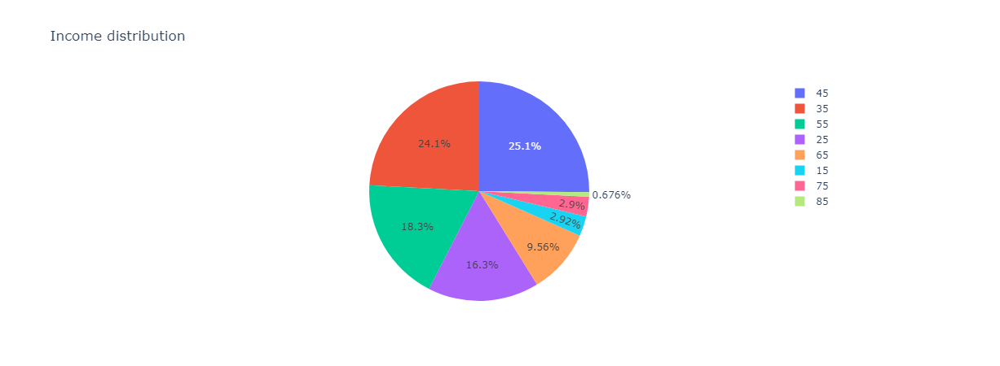

In [20]:
fig = px.pie(data['df'], values='age_bin', names='age_bin', title='Income distribution')
fig.show()

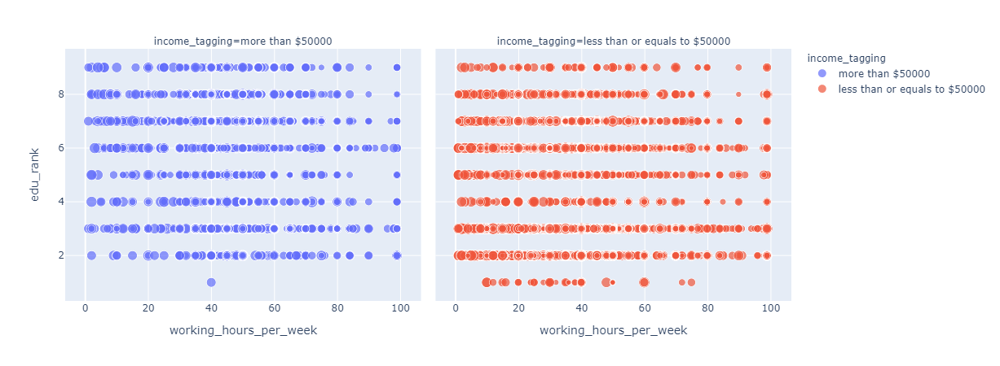

In [21]:
fig = px.scatter(data['df'], x="working_hours_per_week", y="edu_rank", color="income_tagging", size = 'age', size_max=10, facet_col="income_tagging")
fig.show()

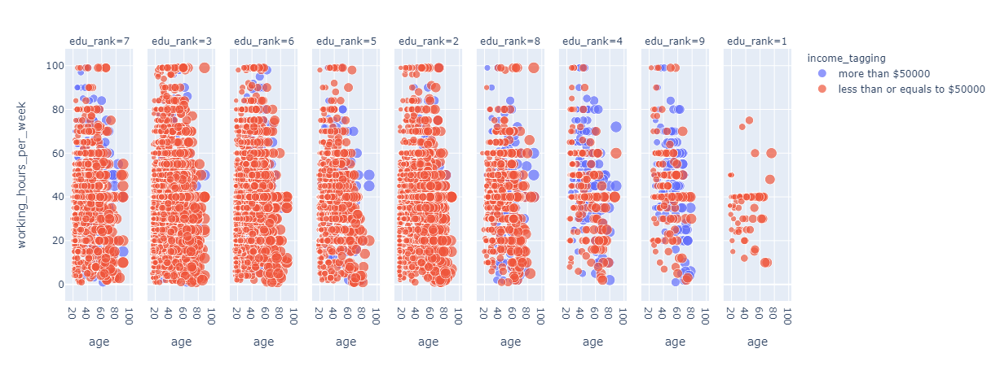

In [22]:
fig = px.scatter(data['df'], x="age", y="working_hours_per_week", color="income_tagging", size = 'age', size_max=10, facet_col="edu_rank")
fig.show()

#### Feature importance

In [23]:
%%time
data['rfe_col_num'] = 3
data['rfe_clf'] = ensemble.RandomForestClassifier()
# data['rfe_clf'] = DecisionTreeClassifier()

data = feature_importance(data)
data["feature_importance"]

Wall time: 37.2 s


{1: ['relationship', 'investment', 'edu_hour'],
 2: ['age'],
 3: ['job'],
 4: ['edu_rank'],
 5: ['marital_status'],
 6: ['working_hours_per_week'],
 7: ['working_sector'],
 8: ['age_bin'],
 9: ['origin_country'],
 10: ['education'],
 11: ['pnl'],
 12: ['continent'],
 13: ['edu_type']}

##### Remove unnecessary features

In [24]:
del data["df"]["edu_type"]
del data["df"]["continent"]

##### Split and Encode data

In [25]:
data = split_x_y(data)
data = encode_data(data)

print(f'y_encoded : {data["y_encoded"]}')
data["x_dummied"].head()

----------------------------
categorical_columns : ['working_sector', 'origin_country', 'education', 'marital_status', 'job', 'relationship']
numerical_columns : ['age', 'working_hours_per_week', 'investment', 'age_bin', 'edu_rank', 'edu_hour']
----------------------------
----------------------------
x_dummied df ready
y_encoded series ready
----------------------------
y_encoded : [1 1 0 ... 0 0 0]


,age,working_hours_per_week,investment,age_bin,pnl,edu_rank,edu_hour,working_sector_government,working_sector_no salary,working_sector_other,...,job_professional specialty,job_protective services,job_sales,job_technical support,relationship_husband,relationship_not in family,relationship_other relative,relationship_own child,relationship_unmarried,relationship_wife
0,36,40,0,35,0.0,7,280,1,0,0,...,1,0,0,0,1,0,0,0,0,0
1,41,38,0,45,0.0,3,114,1,0,0,...,0,0,0,0,0,0,0,0,0,1
2,22,40,0,25,0.0,6,240,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,34,42,0,35,0.0,6,252,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,27,36,0,25,0.0,5,180,0,0,0,...,0,0,0,1,0,0,1,0,0,0


#### ML Modelling

##### Train-Test split

In [26]:
data["train_x"], data["valid_x"], data["train_y"], data["valid_y"] = train_test_split(data["x_dummied"], data["y_encoded"],train_size = 0.8,random_state = 1)

##### Model Comparison

In [27]:
for model_key in data["models"].keys():    
    data['classifier'] = data["models"][model_key]        
    data = train_model(data)    
    data['accuracy'][model_key] = data['acc']

print(f'Model Accuracies')
print('------------------------')
data['accuracy']    

Model Accuracies
------------------------


{'LOG': 0.829954954954955,
 'RF': 0.8438779688779688,
 'KNN': 0.8378378378378378,
 'DT': 0.8194103194103194,
 'XG': 0.8693693693693694}

##### Selected Model

In [28]:
data['selected_model'] = data["models"]["XG"]
data = result_report(data)

--------------------------------
selected model : XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='logloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=12,
              num_parallel_tree=1, random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              validate_parameters=1, verbosity=None)
--------------------------------
Accuracy       : 0.8693693693693694
--------------------------------


In [31]:
data = print_classification_report(data)

              precision    recall  f1-score   support

           0       0.90      0.94      0.92      7458
           1       0.76      0.65      0.70      2310

    accuracy                           0.87      9768
   macro avg       0.83      0.79      0.81      9768
weighted avg       0.86      0.87      0.87      9768



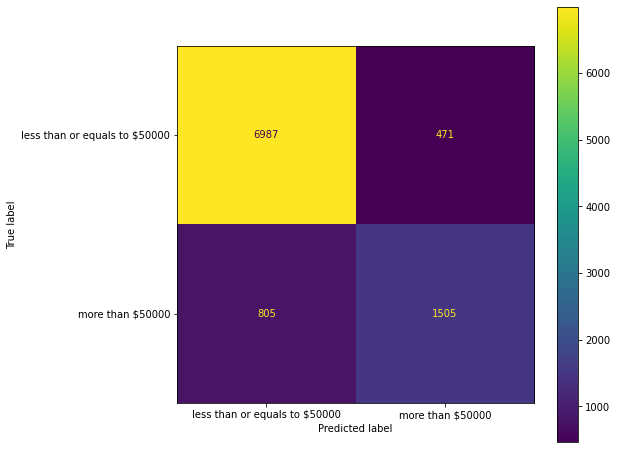

In [32]:
data = print_confusion_matrix(data)

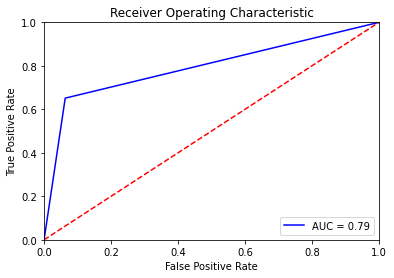

In [33]:
data = print_roc_curve(data)

#### Deep learning : Tensorflow

##### Neural Network definition

In [34]:
model = Sequential([
    Dense(units = 2048, activation='relu', input_shape=(89,)),
    Dense(units = 1024, activation='relu',),
    Dense(units = 512, activation='relu'),    
    Dense(units = 256, activation='relu'),
    Dense(units = 128, activation='relu'),
    Dense(units = 2, activation='softmax')
])

model.compile(    
    loss=CategoricalCrossentropy(),
    optimizer=Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, decay=0.01),
    metrics=CategoricalAccuracy())

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 2048)              184320    
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              2098176   
_________________________________________________________________
dense_2 (Dense)              (None, 512)               524800    
_________________________________________________________________
dense_3 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_4 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_5 (Dense)              (None, 2)                 258       
Total params: 2,971,778
Trainable params: 2,971,778
Non-trainable params: 0
______________________________________________

##### Data prep for Tensorflow

In [35]:
data = prep_data_for_tf(data)

##### NN Model training

In [36]:
data["epoch_val"]         = 20
data["batch_size_val"]    = 64

In [37]:
model.fit(x = data["train_x_t"], 
          y = data["train_y_t"], 
          epochs = data["epoch_val"],
          batch_size = data["batch_size_val"],
          validation_data = (data["valid_x_t"], data["valid_y_t"]),
          workers = data["workers_val"],
          verbose = data["verbose_val"])

Epoch 1/20
611/611 - 2s - loss: 0.3419 - categorical_accuracy: 0.8410 - val_loss: 0.3267 - val_categorical_accuracy: 0.8493
Epoch 2/20
611/611 - 2s - loss: 0.3138 - categorical_accuracy: 0.8532 - val_loss: 0.3211 - val_categorical_accuracy: 0.8517
Epoch 3/20
611/611 - 1s - loss: 0.3076 - categorical_accuracy: 0.8581 - val_loss: 0.3203 - val_categorical_accuracy: 0.8521
Epoch 4/20
611/611 - 2s - loss: 0.3046 - categorical_accuracy: 0.8586 - val_loss: 0.3192 - val_categorical_accuracy: 0.8502
Epoch 5/20
611/611 - 1s - loss: 0.3023 - categorical_accuracy: 0.8595 - val_loss: 0.3175 - val_categorical_accuracy: 0.8514
Epoch 6/20
611/611 - 1s - loss: 0.3010 - categorical_accuracy: 0.8599 - val_loss: 0.3177 - val_categorical_accuracy: 0.8521
Epoch 7/20
611/611 - 1s - loss: 0.2998 - categorical_accuracy: 0.8611 - val_loss: 0.3170 - val_categorical_accuracy: 0.8527
Epoch 8/20
611/611 - 1s - loss: 0.2987 - categorical_accuracy: 0.8618 - val_loss: 0.3173 - val_categorical_accuracy: 0.8518
Epoch 9/